<a href="https://colab.research.google.com/github/athenianravenclaw/ASR-Basics/blob/main/ASR_SpeechBrain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies

If you have any issues using `gdown` the same data and config files are available directly via Google Drive [here](https://drive.google.com/drive/folders/1yKSJ6fSSs24c2JL8kpqa311YTELWZ2p7)

In [ ]:
# setup
!gdown 1k2XrxbCz76MG1LptUpcFgocelLMGk5Mu
!unzip -q hvb.zip
!mv content/data /content/
!rm -r /content/content

!gdown 1v_3Kl8OrUd6_1_D0ZGoYVFEuOKhZ7YMo # train.py
!gdown 17cQIpx5kLLMCD23EDaE0EYg2E9LPqMCF # train.yaml
!gdown 1CWYOD2PC97gXguW4krc9122HKAraHkYS # inference.yaml

!pip install speechbrain -q

Downloading...
From (original): https://drive.google.com/uc?id=1k2XrxbCz76MG1LptUpcFgocelLMGk5Mu
From (redirected): https://drive.google.com/uc?id=1k2XrxbCz76MG1LptUpcFgocelLMGk5Mu&confirm=t&uuid=a9aa484a-14f3-4a21-a8cc-bd79eb4bdd22
To: /content/hvb.zip
100% 2.46G/2.46G [00:49<00:00, 49.9MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1v_3Kl8OrUd6_1_D0ZGoYVFEuOKhZ7YMo
From (redirected): https://drive.google.com/uc?id=1v_3Kl8OrUd6_1_D0ZGoYVFEuOKhZ7YMo&confirm=t&uuid=f911c843-10ce-4e89-b233-6d661f5a3109
To: /content/train.py
100% 18.3k/18.3k [00:00<00:00, 51.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=17cQIpx5kLLMCD23EDaE0EYg2E9LPqMCF
To: /content/train.yaml
100% 12.1k/12.1k [00:00<00:00, 39.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1CWYOD2PC97gXguW4krc9122HKAraHkYS
To: /content/inference.yaml
100% 4.96k/4.96k [00:00<00:00, 20.5MB/s]
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 760.1/760.1 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

In [ ]:
import speechbrain as sb
from speechbrain.inference.ASR import EncoderDecoderASR
import json
import torchaudio
import torch
from torch import nn
from tqdm import tqdm
from collections import Counter
from IPython.display import Audio
from scipy.io import wavfile

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
!pip install speechbrain

# Part 1: Evaluate a pretrained CRDNN model

We continue to use the Harper Valley Bank dataset as in HW3. This time, we aim to build and evaluate our own ASR system with the SpeechBrain framework.

Here, we load a CRDNN model pretrained on LibriSpeech. SpeechBrain has some utils with built-in options to source pre-trained models from a repository on HuggingFace. In this homework we will load a model from HuggingFace, use it for inference, and then fine tune the model on our dataset.

For now, we'll run the model for inference on our dataset.

In [ ]:
crdnn = EncoderDecoderASR.from_hparams(
    source='speechbrain/asr-crdnn-rnnlm-librispeech',
    savedir='asr-crdnn-rnnlm-librispeech',
    run_opts={'device': 'cuda'}
)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


hyperparams.yaml:   0%|          | 0.00/4.83k [00:00<?, ?B/s]

normalizer.ckpt:   0%|          | 0.00/1.41k [00:00<?, ?B/s]

asr.ckpt:   0%|          | 0.00/480M [00:00<?, ?B/s]

lm.ckpt:   0%|          | 0.00/212M [00:00<?, ?B/s]

tokenizer.ckpt:   0%|          | 0.00/253k [00:00<?, ?B/s]

The manifests we prepared for using with SpeechBrain are jsons with the structure
```
{
    "15748": {
        "wav": "/content/data/segments/15748.wav",
        "length": 1.86,
        "words": "WHAT DAY WOULD YOU LIKE FOR YOUR APPOINTMENT"
    },
    ...
}
```

We first load them and define a function to batch them into a format that our `EncoderDecoderASR` object can ingest

In [ ]:
TEST_SIZE = 200 # for faster processing

with open('data/test_manifest.json', 'r') as f:
    test_manifest = json.load(f)
test_manifest = {
    k: v for k, v in list(test_manifest.items())[:TEST_SIZE]
}

def batchify(manifest, batch_size):
    keys = list(manifest.keys())
    wav_paths = list(map(lambda x: x['wav'], manifest.values()))
    iterable = zip(keys, wav_paths)
    num_examples = len(manifest)
    for i in range(0, num_examples, batch_size):
        batch_wavs = nn.utils.rnn.pad_sequence([
            torchaudio.load(path)[0].squeeze(0)
            for path in wav_paths[i:min(i + batch_size, num_examples)]
        ], batch_first=True)
        batch_keys = keys[i:min(i + batch_size, num_examples)]
        batch_wav_lens = torch.tensor([
            manifest[key]['length'] for key in batch_keys
        ])
        batch_wav_lens = batch_wav_lens / batch_wav_lens.max()
        yield batch_keys, batch_wavs, batch_wav_lens

Next, we feed our test examples through the ASR model:

In [ ]:
true_dict = {key: test_manifest[key]['words'] for key in test_manifest}

def inference(model, test_manifest, batch_size=8):
    torch.cuda.empty_cache()
    pred_dict = {}
    for keys, wavs, wav_lens in tqdm(batchify(test_manifest, batch_size), total=round(len(test_manifest) / batch_size + 0.5)):
        transcriptions, _ = model.transcribe_batch(wavs.to(device), wav_lens.to(device))
        for key, transcription in zip(keys, transcriptions):
            pred_dict[key] = transcription
    return pred_dict

pred_dict = inference(crdnn, test_manifest)

 23%|██▎       | 6/26 [00:19<01:08,  3.44s/it]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:306: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv1d(input, weight, bias, self.stride,
 96%|█████████▌| 25/26 [01:18<00:03,  3.14s/it]


Finally, we check the word error rate on our test set.

In [ ]:
# this data structure stores WER information we use later.
details_by_utterance = sb.utils.edit_distance.wer_details_by_utterance(
    {k: v.split() for k, v in true_dict.items()},
    {k: v.split() for k, v in pred_dict.items()},
)

In [ ]:
# word error rate (WER) summary using data structure we just created
sb.utils.edit_distance.wer_summary(details_by_utterance)

{'WER': 67.07988980716253,
 'SER': 87.0,
 'num_edits': 974,
 'num_scored_tokens': 1452,
 'num_erraneous_sents': 174,
 'num_scored_sents': 200,
 'num_absent_sents': 0,
 'num_ref_sents': 200,
 'insertions': 354,
 'deletions': 107,
 'substitutions': 513}

 Investigating where our system is making mistakes by checking some of the top missed utterances.

In [ ]:
def summarize(detail_dict, true_dict, pred_dict):
    print(f"{detail_dict['key']}: {detail_dict['WER']}")
    print(f"\tTrue: {true_dict[detail_dict['key']]}")
    print(f"\tPred: {pred_dict[detail_dict['key']]}")

for wer_dict in sb.utils.edit_distance.top_wer_utts(details_by_utterance, 10)[0]:
    summarize(wer_dict, true_dict, pred_dict)

1130: 1300.0
	True: ALRIGHT
	Pred: RIPE RIPE RIPE RIPE RIPE RIPE RIPE RIPE RIPE RIPE RIPE RIPE RIGHT
3020: 712.5
	True: OKAY THANKS AND WHAT IS THE BILL AMOUNT
	Pred: OKAY THANKS AND WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THINK AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THINK AN WHAT IF YE DON'T AMOUNT THINK AN WHAT IF Y
20613: 600.0
	True: BYE
	Pred: I DON'T EAT DRINK EAT DRINK
5390: 600.0
	True: NO
	Pred: NOW'S NOW NOW NOW NOW NOW
23590: 550.0
	True: OKAY ONE SECOND PLEASE
	Pred: WON'T THAT CAN PLEAD PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEADING PLEA
22147: 480.0
	True: WHAT IS THE TRANSFER AMOUNT
	Pred: WHAT'S THE TRANSFER AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT AMOUNT A

Seems that our predictions keep outputting the same word over and over. Let's see why

Select some examples the model mis-transcribes, and try to build a hypothesis around what in the data is associated with the model making mistkes.
Visualize at least 3 example mistake types:
- Repeated wrong word
- A few correct words but clearly wrong transcript
- Another example with transcription error of your choice

For each example:
- Play the audio
- Print the true and predicted transcripts
- Plot a log spectrogram
- Comment (in text) on why you think the model may have made a mistake on this audio. It could include issues like channel quality, background noise, long sections of silence / endpointing issues, etc.

In [ ]:
Audio(test_manifest['13769']['wav'])

In [ ]:
true_dict['13769']

"UHM NO I DON'T THINK SO I THINK THAT'S IT YOU'VE BEEN VERY HELPFUL"

In [ ]:
pred_dict['13769']

"NOW I DON'T THINK I THINK IF YOU'VE BEEN VERY MALCOLM"

In [ ]:
example = details_by_utterance[0]
summarize(example, true_dict, pred_dict)
Audio(test_manifest[example['key']]['wav'])


15748: 75.0
	True: WHAT DAY WOULD YOU LIKE FOR YOUR APPOINTMENT
	Pred: WHAT DAY WOULD YOU LIKE FREELY APPOINT APPOINTMENT TO APPOINT APPOINTMENT APPOINTMENT


In [ ]:
def plot_log_spectrogram(wav_file, title='Log Spectrogram'):
    y, sr = librosa.load(wav_file, sr=None)
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)

    plt.figure(figsize=(10, 6))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Plot log spectrograms for examples in details_by_utterance
for example in details_by_utterance:
    key = example['key']
    wav_file = test_manifest[key]['wav']
    plot_log_spectrogram(wav_file, title=f'Log Spectrogram of {key}')

Identified that utterances with many repeated word predictions might be associated with audio and endpointing quality in the HVB dataset. To avoid seeing only this error mode when looking at test results, filtering out from our dev set utterances with repeated word predictions.



In [ ]:
def repeated_words(transcript):
    """
    Function that returns True or False if `transcript` suffers from the
    repeated words error or not.
    """

    words = transcript.split()

    for i in range(len(words) - 1):
        if words[i] == words[i + 1]:
            return True

    return False


Filtering our predictions based on this and checking what proportion of examples this kind of error affects

In [ ]:
pred_dict_filtered = {
    k: v for k, v in pred_dict.items() if not repeated_words(v)
}
true_dict_filtered = {k: true_dict[k] for k in pred_dict_filtered}

print(1 - len(pred_dict_filtered) / len(pred_dict))

0.11499999999999999


And we finally print our WER stats again on this filtered set

In [ ]:
details_by_utterance_filtered = sb.utils.edit_distance.wer_details_by_utterance(
    {k: v.split() for k, v in true_dict_filtered.items()},
    {k: v.split() for k, v in pred_dict_filtered.items()},
)
sb.utils.edit_distance.wer_summary(details_by_utterance_filtered)

{'WER': 57.66312594840668,
 'SER': 85.31073446327683,
 'num_edits': 760,
 'num_scored_tokens': 1318,
 'num_erraneous_sents': 151,
 'num_scored_sents': 177,
 'num_absent_sents': 0,
 'num_ref_sents': 177,
 'insertions': 211,
 'deletions': 98,
 'substitutions': 451}

In [ ]:

for wer_dict in sb.utils.edit_distance.top_wer_utts(details_by_utterance_filtered, 10)[0]:
      summarize(wer_dict, true_dict_filtered, pred_dict_filtered)


3020: 712.5
	True: OKAY THANKS AND WHAT IS THE BILL AMOUNT
	Pred: OKAY THANKS AND WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THINK AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THANKS AN WHAT IF YE DON'T AMOUNT THINK AN WHAT IF YE DON'T AMOUNT THINK AN WHAT IF Y
20613: 600.0
	True: BYE
	Pred: I DON'T EAT DRINK EAT DRINK
14823: 285.7142857142857
	True: HI MY NAME IS PATRICIA GARCIA I NEED TO CHECK MY BANK ACCOUNT TODAY
	Pred: HOW MANY WITH PETITS AND GARTHAE OF ANY ADJECT MY BANK COUNTED TO IT IT'S MONEY IT'S PETIT AND GARRISON OF ANY ADJECT MY BANK COUNT TO IT IT'S MONEY IT'S BERTUCCIOGRAPHY OF ANY ADJECT MY BANK COUNT TO IT IT'S MONEY IT'S PETIT 
17273: 200.0
	True: <UNK>
	Pred: AIN'T YE
16366: 200.0
	True: FOREST
	Pred: IT'S RHYMMYMMMMMMMMMMMMMYMMMMMMMMMMMMMMMYMMMMMMMMMMMMMMMYMMMMMMMMMMMMMYMMMMMMMMMMMMYMMMMMMMMMMYMMMMMMMMYMMMMMMMMYMMMMMMMMYMMMMMMMMYMMMMMMYMMMMMMMM
12558: 200.0
	True: ORE

In [29]:
import librosa
import numpy as np

def detect_noise_or_silence(audio_file, silence_threshold=0.01, min_silence_duration=1.0, noise_threshold=0.05):
    """
    Detects if an audio file has long periods of silence or significant background noise.

    Parameters:
    - audio_file: Path to the audio file
    - silence_threshold: Amplitude threshold below which the signal is considered silent
    - min_silence_duration: Minimum duration (in seconds) for which the signal must be below the silence threshold to be considered long silence
    - noise_threshold: Amplitude threshold above which the signal is considered noisy

    Returns:
    - True if the audio file contains long silence or significant background noise, False otherwise
    """
    y, sr = librosa.load(audio_file)

    # Compute the amplitude envelope
    amplitude_envelope = np.abs(librosa.stft(y, n_fft=2048, hop_length=512))

    # Calculate the mean amplitude across frames
    mean_amplitude = np.mean(amplitude_envelope, axis=0)

    # Detect long silence
    silent_frames = mean_amplitude < silence_threshold
    silent_durations = librosa.frames_to_time(np.where(silent_frames), sr=sr)
    if any(np.diff(silent_durations) > min_silence_duration):
        return True

    # Detect background noise
    if np.mean(mean_amplitude) > noise_threshold:
        return True

    return False


In [31]:
import os
import librosa
import numpy as np

def detect_noise_or_silence(audio_file, silence_threshold=0.01, min_silence_duration=1.0, noise_threshold=0.1):
    """
    Detects if an audio file has long periods of silence or significant background noise.

    Parameters:
    - audio_file: Path to the audio file
    - silence_threshold: Amplitude threshold below which the signal is considered silent
    - min_silence_duration: Minimum duration (in seconds) for which the signal must be below the silence threshold to be considered long silence
    - noise_threshold: Amplitude threshold above which the signal is considered noisy

    Returns:
    - True if the audio file contains long silence or significant background noise, False otherwise
    """
    y, sr = librosa.load(audio_file)

    # Compute the amplitude envelope
    amplitude_envelope = np.abs(librosa.stft(y, n_fft=2048, hop_length=512))

    # Calculate the mean amplitude across frames
    mean_amplitude = np.mean(amplitude_envelope, axis=0)

    # Detect long silence
    silent_frames = mean_amplitude < silence_threshold
    silent_durations = librosa.frames_to_time(np.where(silent_frames)[0], sr=sr)
    if any(np.diff(silent_durations) > min_silence_duration):
        return True

    # Detect background noise
    if np.mean(mean_amplitude) > noise_threshold:
        return True

    return False

def create_audio_file_mapping(folder_path):
    """
    Creates a mapping from segment IDs to audio file paths in the specified folder.

    Parameters:
    - folder_path: Path to the folder containing the .wav files

    Returns:
    - audio_file_mapping: Dictionary mapping segment IDs to audio file paths
    """
    audio_file_mapping = {}
    for filename in os.listdir(folder_path):
        if filename.endswith(".wav"):
            segment_id = os.path.splitext(filename)[0]
            audio_file_mapping[segment_id] = os.path.join(folder_path, filename)
    return audio_file_mapping

def filter_audio_based_on_noise_and_silence(pred_dict, true_dict, folder_path):
    """
    Filters the prediction and true value dictionaries based on background noise or long places of silence.

    Parameters:
    - pred_dict: Dictionary of predictions
    - true_dict: Dictionary of true values
    - folder_path: Path to the folder containing the .wav files

    Returns:
    - pred_dict_filtered: Filtered predictions dictionary
    - true_dict_filtered: Filtered true values dictionary
    """
    audio_file_mapping = create_audio_file_mapping(folder_path)

    pred_dict_filtered = {
        k: v for k, v in pred_dict.items() if not detect_noise_or_silence(audio_file_mapping.get(k, ""))
    }
    true_dict_filtered = {k: true_dict[k] for k in pred_dict_filtered}

    return pred_dict_filtered, true_dict_filtered

folder_path = "/content/data/segments"
pred_dict_filtered, true_dict_filtered = filter_audio_based_on_noise_and_silence(pred_dict, true_dict, folder_path)

# Calculate the ratio of filtered entries
print(1 - len(pred_dict_filtered) / len(pred_dict))



0.965


# Part 2: Finetune the pretrained CRDNN model

In [ ]:
# this downloads the training and config files for our fine tuning setup
!gdown 1v_3Kl8OrUd6_1_D0ZGoYVFEuOKhZ7YMo # train.py
!gdown 17cQIpx5kLLMCD23EDaE0EYg2E9LPqMCF # train.yaml
!gdown 1CWYOD2PC97gXguW4krc9122HKAraHkYS # inference.yaml

Downloading...
From (original): https://drive.google.com/uc?id=1v_3Kl8OrUd6_1_D0ZGoYVFEuOKhZ7YMo
From (redirected): https://drive.google.com/uc?id=1v_3Kl8OrUd6_1_D0ZGoYVFEuOKhZ7YMo&confirm=t&uuid=ac1ad801-deed-4fd8-8d28-85ed42047271
To: /content/train.py
100% 18.3k/18.3k [00:00<00:00, 62.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=17cQIpx5kLLMCD23EDaE0EYg2E9LPqMCF
To: /content/train.yaml
100% 12.1k/12.1k [00:00<00:00, 34.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1CWYOD2PC97gXguW4krc9122HKAraHkYS
To: /content/inference.yaml
100% 4.96k/4.96k [00:00<00:00, 19.0MB/s]


In [ ]:
!pip install --upgrade speechbrain




```
```

** Fine tuning training**

In [ ]:
torch.cuda.empty_cache()

!python train.py train.yaml --batch_size=4
# OOM on batch_size=5

speechbrain.core - Beginning experiment!
speechbrain.core - Experiment folder: results/CRDNN_BPE_960h_LM/2602
speechbrain.utils.fetching - Fetch lm.ckpt: Using existing file/symlink in results/CRDNN_BPE_960h_LM/2602/save/lm.ckpt.
speechbrain.utils.fetching - Fetch tokenizer.ckpt: Using existing file/symlink in results/CRDNN_BPE_960h_LM/2602/save/tokenizer.ckpt.
speechbrain.utils.fetching - Fetch asr.ckpt: Using existing file/symlink in results/CRDNN_BPE_960h_LM/2602/save/model.ckpt.
speechbrain.utils.parameter_transfer - Loading pretrained files for: lm, tokenizer, model
speechbrain.core - Info: ckpt_interval_minutes arg from hparam file is used
speechbrain.core - Gradscaler enabled: False. Using precision: fp32.
speechbrain.core - 173.0M trainable parameters in ASR
speechbrain.utils.checkpoints - Loading a checkpoint from results/CRDNN_BPE_960h_LM/2602/save/CKPT+2024-06-28+21-38-31+00
speechbrain.utils.epoch_loop - Going into epoch 1
 84% 2872/3405 [00:00<?, ?it/s]/usr/local/lib/pytho

# Part 3: Evaluate our finetuned model


In [ ]:
ckpt_path = "/content/results/CRDNN_BPE_960h_LM/2602/save/CKPT+2024-06-28+22-09-26+00"
!cp inference.yaml {ckpt_path}

In [ ]:
device = 'cpu'
our_model = EncoderDecoderASR.from_hparams(
    source=ckpt_path,
    hparams_file='inference.yaml',
    savedir="our_ckpt",
    run_opts={'device': device}
)

In [ ]:
pred_dict = inference(our_model.to(device), test_manifest)

 96%|█████████▌| 25/26 [30:57<01:14, 74.28s/it]


## **Task: WER analysis on fine tuned model's predictions** (10 points)

Report WER on the dev set for the fine tuned model. Include the full WER summary information provided by the SpeechBrain util.

In our experiments, fine tuning yields a WER < 50%, which is an improvement compared with the original system. This is without filtering the dev set for noisy examples.

In [ ]:
details_by_utterance = sb.utils.edit_distance.wer_details_by_utterance(
    {k: v.split() for k, v in true_dict.items()},
    {k: v.split() for k, v in pred_dict.items()},
)
sb.utils.edit_distance.wer_summary(details_by_utterance)

{'WER': 37.53443526170799,
 'SER': 44.5,
 'num_edits': 545,
 'num_scored_tokens': 1452,
 'num_erraneous_sents': 89,
 'num_scored_sents': 200,
 'num_absent_sents': 0,
 'num_ref_sents': 200,
 'insertions': 428,
 'deletions': 22,
 'substitutions': 95}

In [ ]:

for wer_dict in sb.utils.edit_distance.top_wer_utts(details_by_utterance, 10)[0]:
      summarize(wer_dict, true_dict, pred_dict)


16366: 800.0
	True: FOREST
	Pred: FOREST THANK YOU FOR CALLING HAVE A GREAT DAY
16839: 680.0
	True: WHAT IS YOUR PHONE NUMBER
	Pred: WHAT IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR PHONE NUMBER IS YOUR
12558: 400.0
	True: OREGON
	Pred: OREGON OKAY OREGON OKAY OREGON
7225: 333.3333333333333
	True: YOU TOO BYE
	Pred: TO IS THERE ANYTHING ELSE I CAN HELP YOU WITH
19619: 333.3333333333333
	True: OKAY SO THE TRANSFER WAS SUCCESSFUL WAS THERE ANYTHING ELSE I CAN HELP YOU WITH
	Pred: OKAY SO THE TRANSFER MONEY IS THERE ANYTHING ELSE I CAN HELP YOU WITH THANK YOU TRANSFERRED IS THERE ANYTHING ELSE I CAN HELP YOU WITH THANK YOU TRANSFERRED IS THERE ANYTHING ELSE I CAN HELP YOU WITH THANK YOU TRANSFERRED IS THERE ANYTHING ELSE I CAN HELP YOU WITH THANK YOU TRANSFERRED IS THERE ANYTHING ELSE I CAN HELP YOU WITH
21639: 262.5
	True: WHAT DAY WOULD YOU LIKE FOR YOUR AP

In [ ]:


example = details_by_utterance[0]
summarize(example, true_dict, pred_dict)
Audio(test_manifest[example['key']]['wav'])



15748: 150.0
	True: WHAT DAY WOULD YOU LIKE FOR YOUR APPOINTMENT
	Pred: WHAT DAY WOULD YOU LIKE FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT


Example Key: 15748
Ground Truth: WHAT DAY WOULD YOU LIKE FOR YOUR APPOINTMENT
Prediction: WHAT DAY WOULD YOU LIKE FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT FOR YOUR APPOINTMENT
Error: True


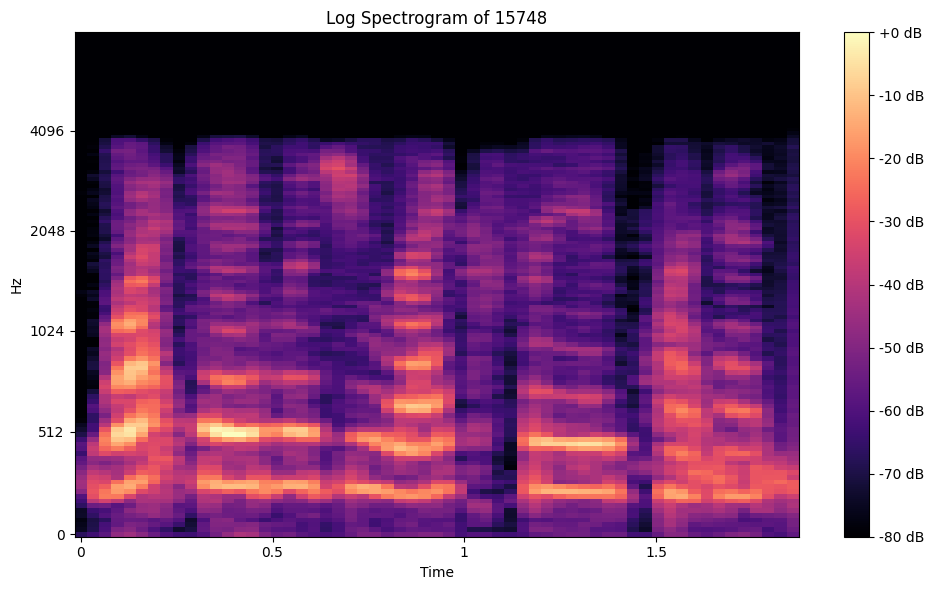

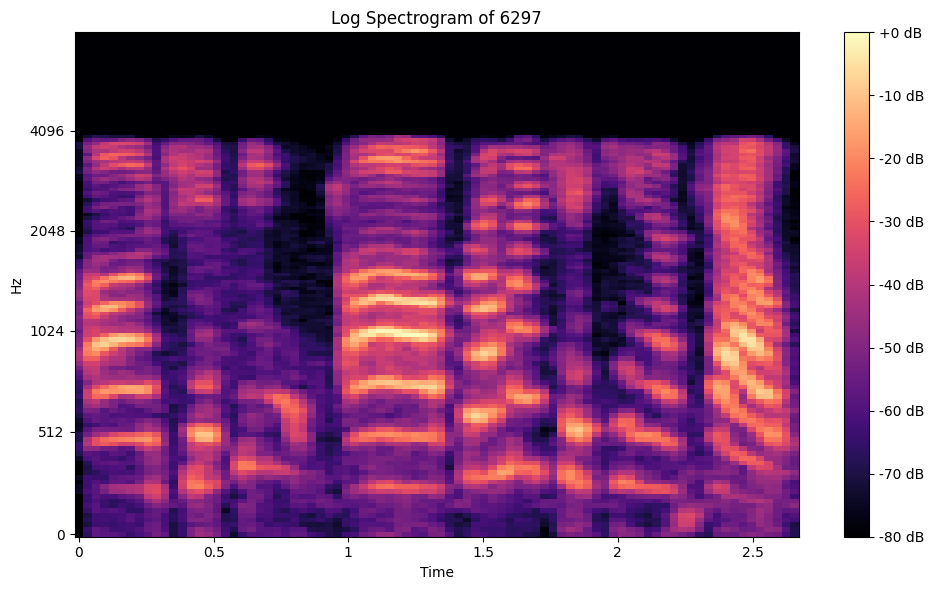

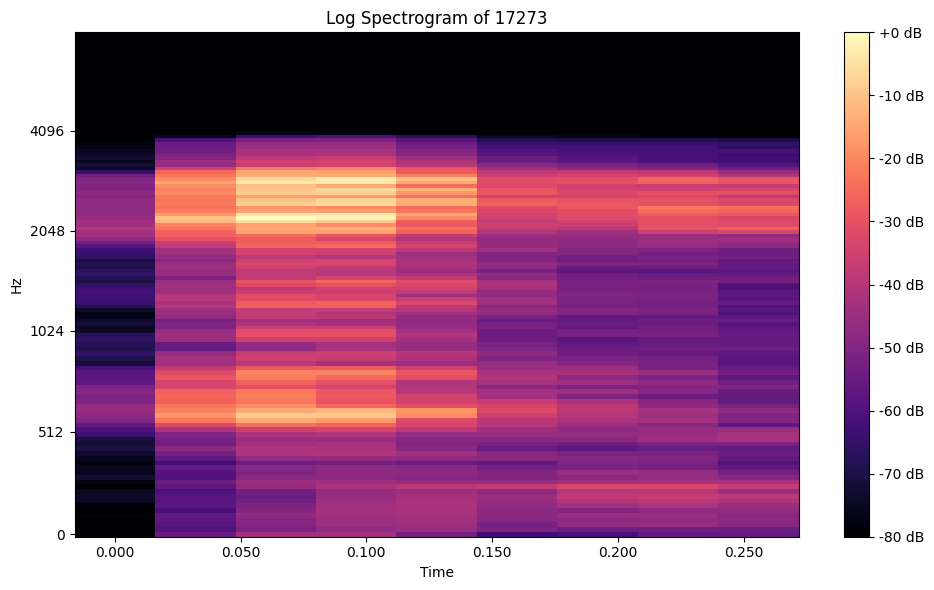

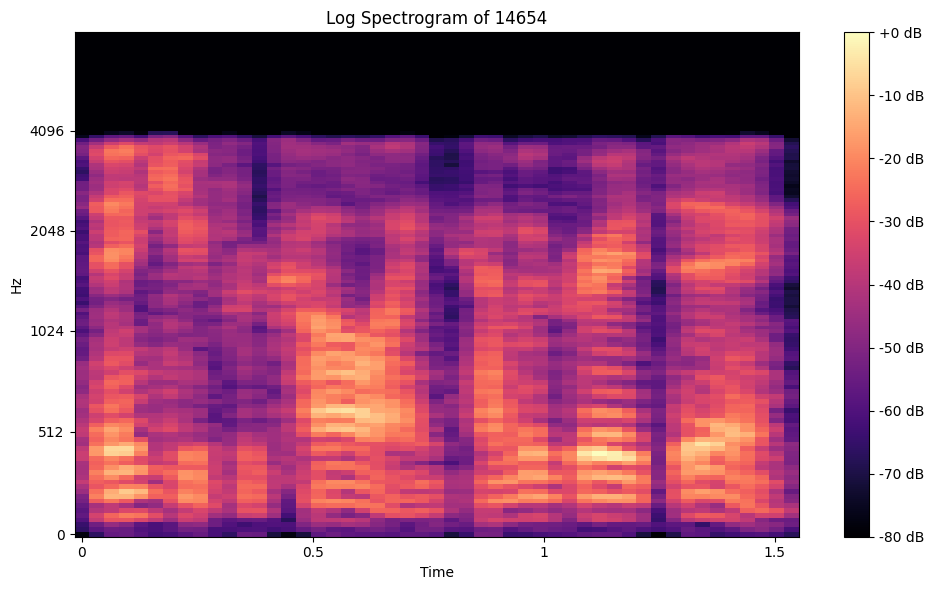

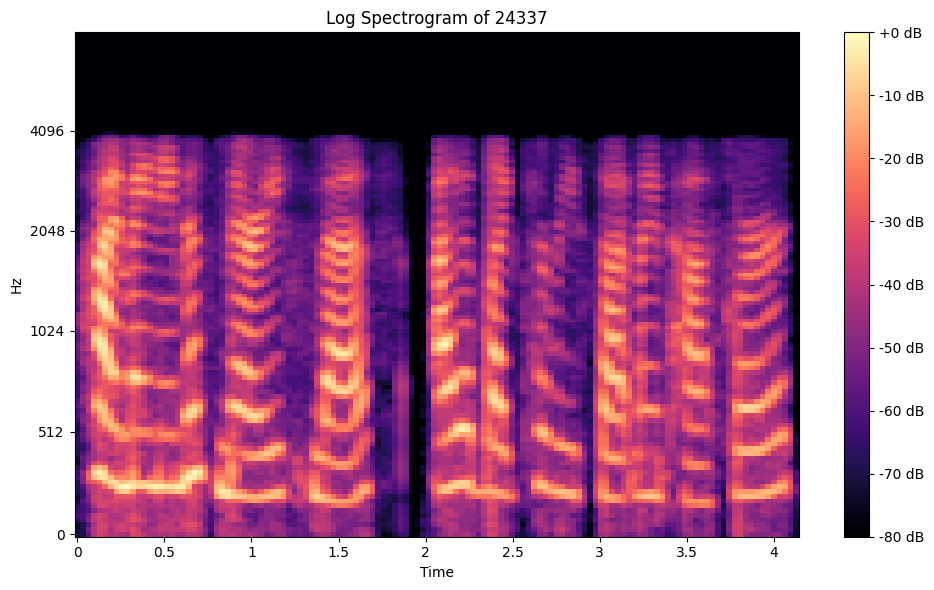

...

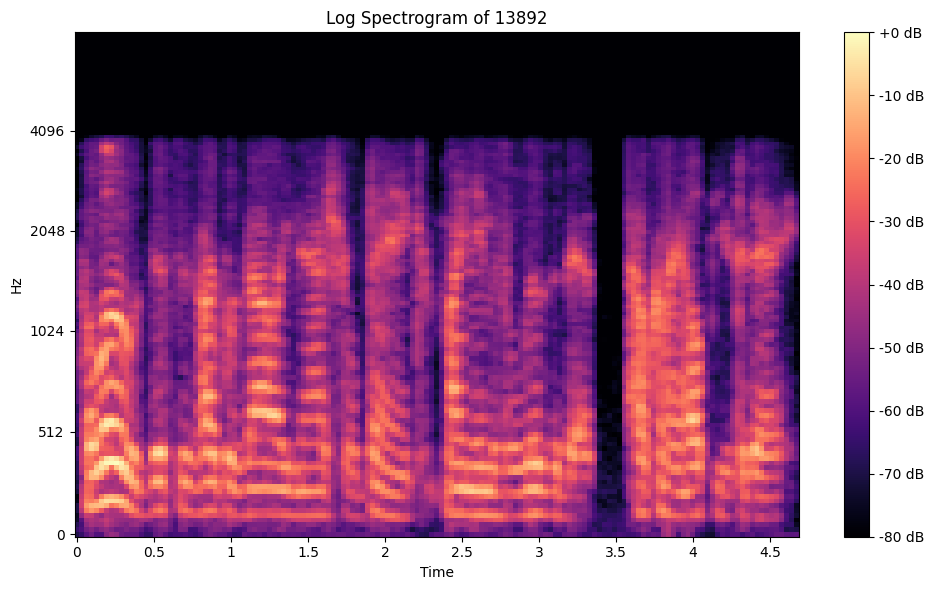

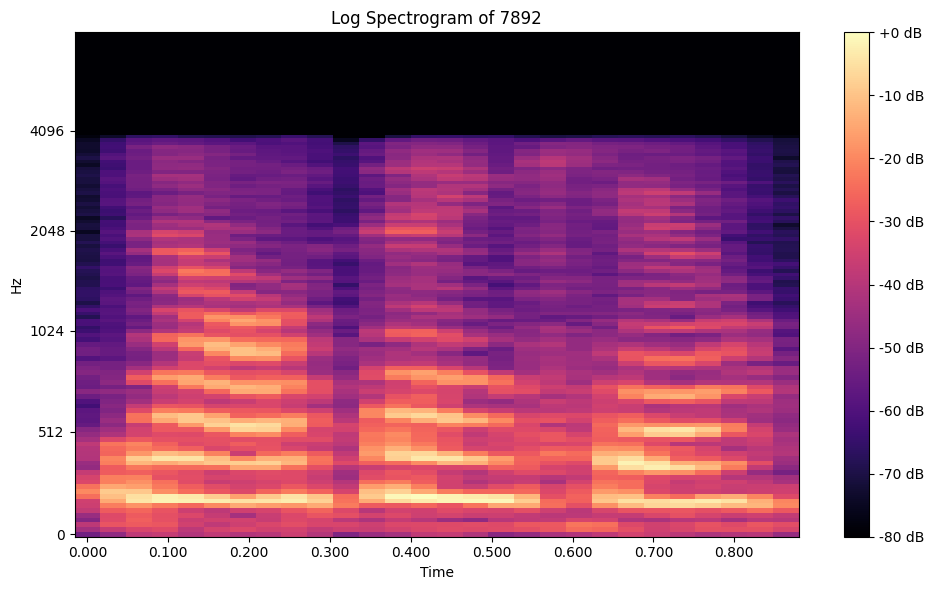

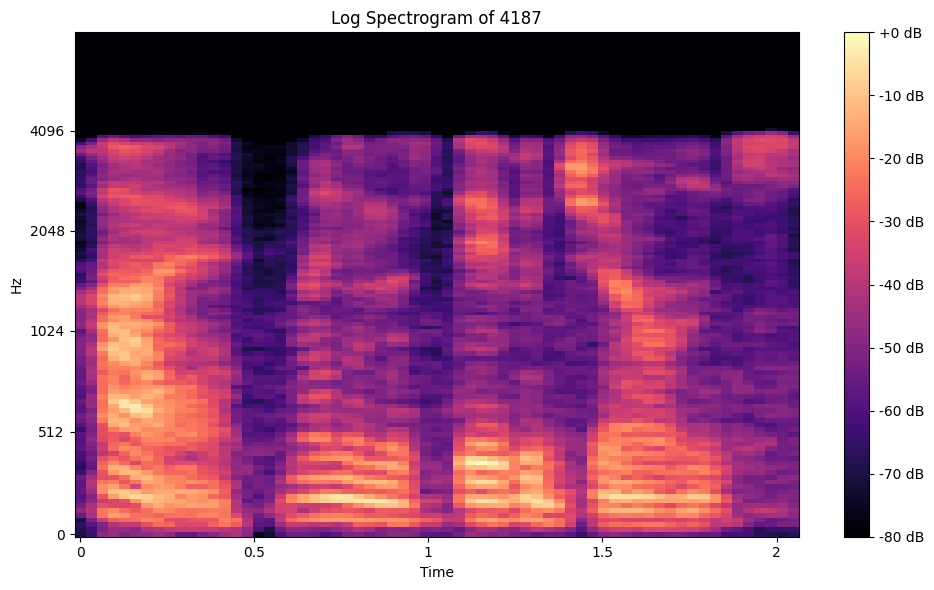

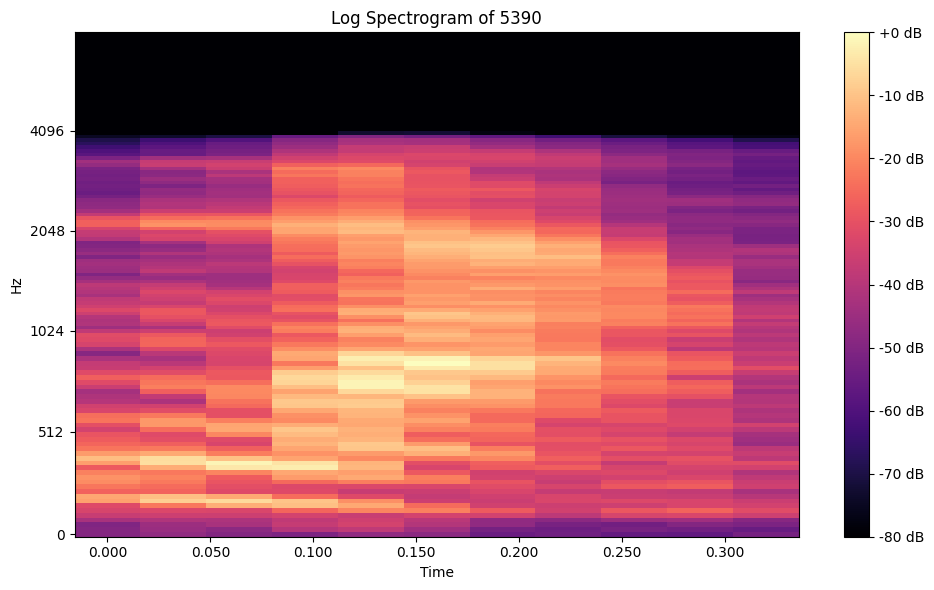

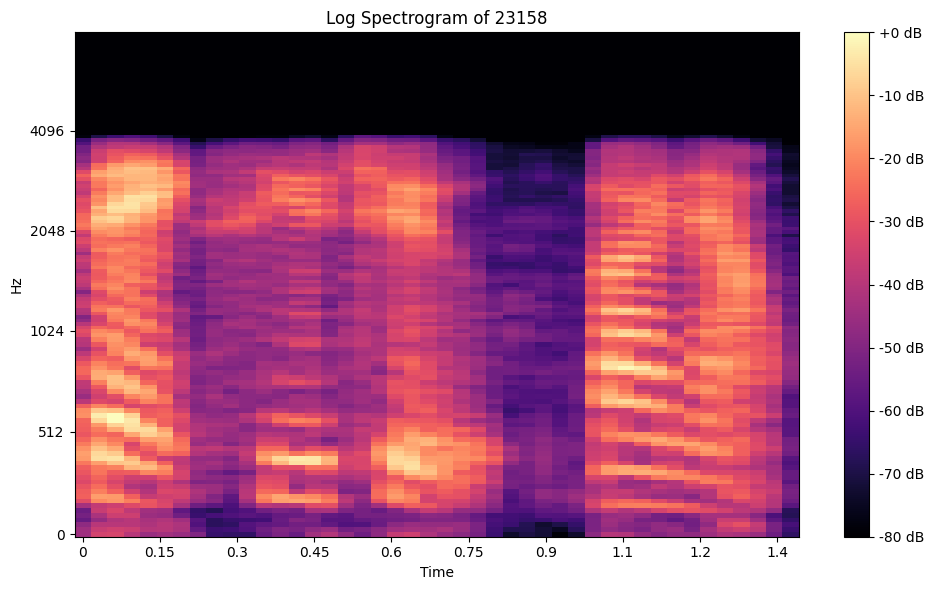

In [ ]:
import IPython.display as ipd
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt

def summarize(example, true_dict, pred_dict):
    key = example['key']
    true_transcript = true_dict[key]
    pred_transcript = pred_dict[key]

    print(f"Example Key: {key}")
    print(f"Ground Truth: {true_transcript}")
    print(f"Prediction: {pred_transcript}")
    print(f"Error: {true_transcript != pred_transcript}")

    # Display the audio
    wav_file = test_manifest[key]['wav']
    audio_display = ipd.Audio(wav_file)
    return audio_display

def plot_log_spectrogram(wav_file, title='Log Spectrogram'):
    y, sr = librosa.load(wav_file, sr=None)
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)

    plt.figure(figsize=(10, 6))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Example usage
example = details_by_utterance[0]
audio_display = summarize(example, true_dict, pred_dict)
audio_display

# Plot log spectrograms for examples in details_by_utterance
for example in details_by_utterance:
    key = example['key']
    wav_file = test_manifest[key]['wav']
    plot_log_spectrogram(wav_file, title=f'Log Spectrogram of {key}')


In [ ]:
\